# EDA of SPXW Data

### Plan for EDA
Each section will compare overall vs put vs call
1. Describing the data
2. Correlation Analyses
3. Time Series Data
4. Greeks

The target variable to be predicted is `close`

Data used is option quotes from the last trading friday of 3 months (Jul 2024, Aug 2024, Sep 2024)
<br><br>
<i>Source: Chicago Board Options Exchange</i>

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Describing the data

In [3]:
df1 = pd.read_csv('../data/SPX/UnderlyingOptionsIntervals_3600sec_calcs_oi_2024-07-26.csv')
df2 = pd.read_csv('../data/SPX/UnderlyingOptionsIntervals_3600sec_calcs_oi_2024-08-30.csv')
df3 = pd.read_csv('../data/SPX/UnderlyingOptionsIntervals_3600sec_calcs_oi_2024-09-27.csv')

In [5]:
# Concatenating data to form a combined dataframe for put options
df_call = pd.concat([
    df1[(df1['option_type'] == 'C') & (df1['root'] == 'SPXW')],
    df2[(df2['option_type'] == 'C') & (df2['root'] == 'SPXW')],
    df3[(df3['option_type'] == 'C') & (df3['root'] == 'SPXW')]
], ignore_index=True)

print("Null Values:")
print(df_call.isnull().sum())

Null Values:
underlying_symbol           0
quote_datetime              0
root                        0
expiration                  0
strike                      0
option_type                 0
open                        0
high                        0
low                         0
close                       0
trade_volume                0
bid_size                    0
bid                         0
ask_size                    0
ask                         0
underlying_bid              0
underlying_ask              0
implied_underlying_price    0
active_underlying_price     0
implied_volatility          0
delta                       0
gamma                       0
theta                       0
vega                        0
rho                         0
open_interest               0
dtype: int64


In [6]:

df_put = pd.concat([
    df1[(df1['option_type'] == 'P') & (df1['root'] == 'SPX')],
    df2[(df2['option_type'] == 'P') & (df2['root'] == 'SPX')],
    df3[(df3['option_type'] == 'P') & (df3['root'] == 'SPX')]
], ignore_index=True)

print("Null Values:")
print(df_put.isnull().sum())

Null Values:
underlying_symbol           0
quote_datetime              0
root                        0
expiration                  0
strike                      0
option_type                 0
open                        0
high                        0
low                         0
close                       0
trade_volume                0
bid_size                    0
bid                         0
ask_size                    0
ask                         0
underlying_bid              0
underlying_ask              0
implied_underlying_price    0
active_underlying_price     0
implied_volatility          0
delta                       0
gamma                       0
theta                       0
vega                        0
rho                         0
open_interest               0
dtype: int64


### Descriptive Statistics of call dataframe

In [7]:
df_call.describe(include='all')

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,...,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,open_interest
count,173922,173922,173922,173922,173922.000000,173922,173922.000000,173922.000000,173922.000000,173922.000000,...,173922.000000,173922.0,173922.000000,173922.000000,173922.000000,173922.000000,173922.000000,173922.000000,173922.000000,173922.000000
unique,1,21,1,85,NaN,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,^SPX,2024-09-27 16:15:00,SPXW,2024-09-30,NaN,C,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,173922,8345,173922,9590,NaN,173922,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,5142.517105,NaN,10.470596,10.586383,10.396100,10.510548,...,5616.194186,0.0,5607.029293,0.341825,0.664144,0.000726,-0.687670,3.659733,4.691190,162.223738
std,NaN,NaN,NaN,NaN,985.569625,NaN,81.113268,81.203164,81.054648,81.143792,...,115.575753,0.0,114.691712,0.578836,0.359110,0.001063,0.713558,3.999691,5.871847,793.203690
min,NaN,NaN,NaN,NaN,200.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5450.090000,0.0,5448.565000,0.000000,0.000000,0.000000,-15.203300,0.000000,-0.011200,0.000000
25%,NaN,NaN,NaN,NaN,4810.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5488.510000,0.0,5472.665000,0.133100,0.386100,0.000100,-1.003775,0.477100,0.692325,0.000000
50%,NaN,NaN,NaN,NaN,5355.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5607.470000,0.0,5606.305000,0.181800,0.830900,0.000400,-0.530400,2.271200,2.469650,4.000000
75%,NaN,NaN,NaN,NaN,5685.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5740.610000,0.0,5733.735000,0.298400,0.970900,0.001000,-0.143000,5.604275,6.550625,72.000000


In [8]:
df_put.describe(include='all')

,underlying_symbol,quote_datetime,root,expiration,strike,option_type,open,high,low,close,...,underlying_ask,implied_underlying_price,active_underlying_price,implied_volatility,delta,gamma,theta,vega,rho,open_interest
count,82943,82943,82943,82943,82943.000000,82943,82943.000000,82943.000000,82943.000000,82943.000000,...,82943.000000,82943.0,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000,82943.000000
unique,1,21,1,22,NaN,1,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,^SPX,2024-09-27 16:15:00,SPX,2024-10-18,NaN,P,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,82943,3976,82943,8449,NaN,82943,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,4936.404760,NaN,8.187410,8.216931,8.142458,8.172377,...,5616.504666,0.0,5607.339904,0.264496,-0.303190,0.000324,-0.367890,8.781694,-17.378411,2429.353026
std,NaN,NaN,NaN,NaN,1600.216622,NaN,46.211408,46.283158,46.110520,46.180568,...,115.350138,0.0,114.456297,0.203704,0.325361,0.000386,0.310356,8.746967,36.553025,8520.031053
min,NaN,NaN,NaN,NaN,200.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5450.090000,0.0,5448.565000,0.000000,-1.000000,0.000000,-1.880600,0.000000,-437.769300,0.000000
25%,NaN,NaN,NaN,NaN,4100.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5488.510000,0.0,5472.665000,0.152000,-0.497800,0.000100,-0.526550,1.784600,-16.610000,8.000000
50%,NaN,NaN,NaN,NaN,5080.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5607.470000,0.0,5606.305000,0.208100,-0.161500,0.000200,-0.309900,6.318900,-4.562600,255.000000
75%,NaN,NaN,NaN,NaN,5765.000000,NaN,0.000000,0.000000,0.000000,0.000000,...,5740.610000,0.0,5733.735000,0.296600,-0.037900,0.000500,-0.135300,13.027050,-0.826550,1657.000000


In [9]:
df_call.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173922 entries, 0 to 173921
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   underlying_symbol         173922 non-null  object 
 1   quote_datetime            173922 non-null  object 
 2   root                      173922 non-null  object 
 3   expiration                173922 non-null  object 
 4   strike                    173922 non-null  float64
 5   option_type               173922 non-null  object 
 6   open                      173922 non-null  float64
 7   high                      173922 non-null  float64
 8   low                       173922 non-null  float64
 9   close                     173922 non-null  float64
 10  trade_volume              173922 non-null  int64  
 11  bid_size                  173922 non-null  int64  
 12  bid                       173922 non-null  float64
 13  ask_size                  173922 non-null  i

In [10]:
df_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   underlying_symbol         82943 non-null  object 
 1   quote_datetime            82943 non-null  object 
 2   root                      82943 non-null  object 
 3   expiration                82943 non-null  object 
 4   strike                    82943 non-null  float64
 5   option_type               82943 non-null  object 
 6   open                      82943 non-null  float64
 7   high                      82943 non-null  float64
 8   low                       82943 non-null  float64
 9   close                     82943 non-null  float64
 10  trade_volume              82943 non-null  int64  
 11  bid_size                  82943 non-null  int64  
 12  bid                       82943 non-null  float64
 13  ask_size                  82943 non-null  int64  
 14  ask   

### Dropping unnecessary columns
`root`,`underlying_symbol`

In [11]:
df_call = df_call.drop(['root','underlying_symbol','implied_underlying_price'],axis=1)
df_put = df_put.drop(['root','underlying_symbol','implied_underlying_price'],axis=1)

### Converting relevant columns to datetime
`expiration` and `quotedate`

In [12]:
df_call['expiration'] = pd.to_datetime(df_call['expiration'])
df_call['quote_datetime'] = pd.to_datetime(df_call['quote_datetime'])

df_put['expiration'] = pd.to_datetime(df_put['expiration'])
df_put['quote_datetime'] = pd.to_datetime(df_put['quote_datetime'])


## Histograms of key features

### `Strike Price Distribution` <br>
Strike price is the price at which the option can be exercised. <br>

### Observations
* A wide distribution indicates a wide range of strike prices available to traders
* A negative concentration of strike prices indicates the market believes the asset price is likely to decrease

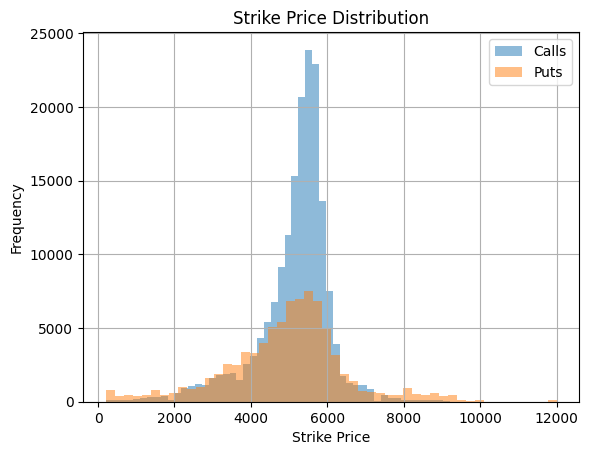

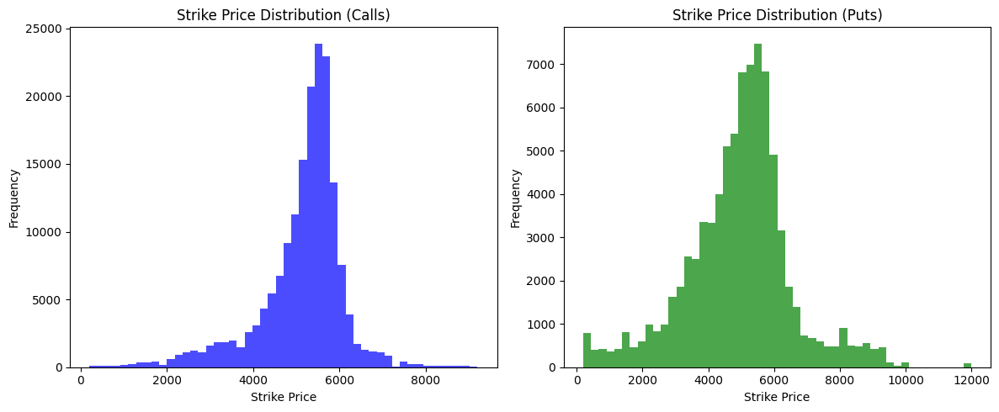

In [13]:
df_call['strike'].hist(bins=50, alpha=0.5, label='Calls')
df_put['strike'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Strike Price Distribution')
plt.xlabel('Strike Price')
plt.ylabel('Frequency')
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(12, 5)) 

ax[0].hist(df_call['strike'], bins=50, alpha=0.7, color='blue', label='Calls')
ax[0].set_title('Strike Price Distribution (Calls)')
ax[0].set_xlabel('Strike Price')
ax[0].set_ylabel('Frequency')

ax[1].hist(df_put['strike'], bins=50, alpha=0.7, color='green', label='Puts')
ax[1].set_title('Strike Price Distribution (Puts)')
ax[1].set_xlabel('Strike Price')
ax[1].set_ylabel('Frequency')

plt.tight_layout() 
plt.show()


### `Implied Volatility Distribution` <br>
Implied volatility reflects the market's expectation of future price volatility. <br>

### Observations
* Calls have a wider distribution, indicating more variation in perception of volatility of SPX calls, some traders expect large upward movement of price and others expect more moderate movements
* Puts have a more concentrated and generally higher IV distribution, this indicates higher uncertainty and greater expected fluctuations of price downwards

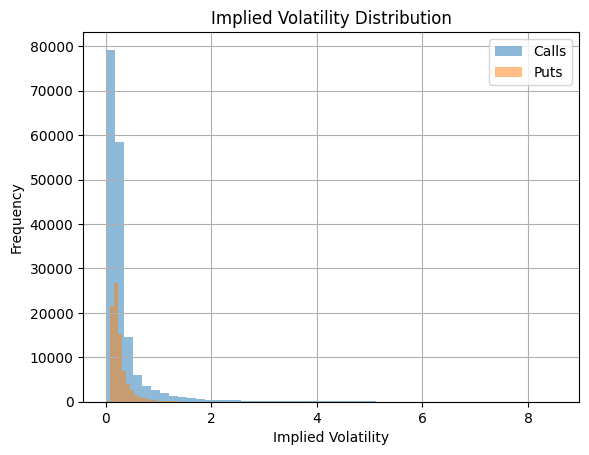

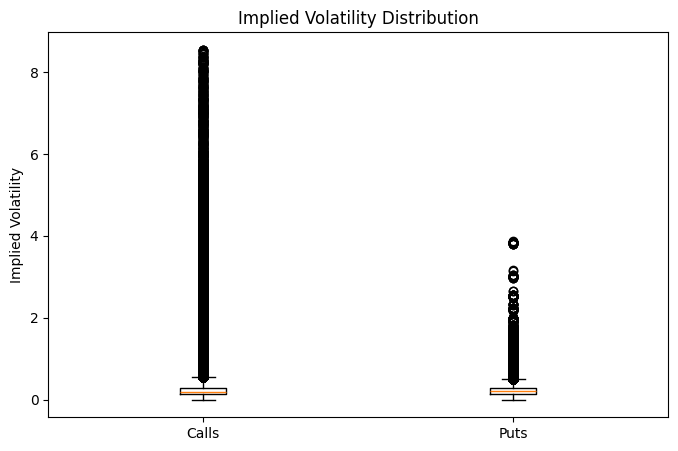

In [14]:
df_call['implied_volatility'].hist(bins=50, alpha=0.5, label='Calls')
df_put['implied_volatility'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Implied Volatility Distribution')
plt.xlabel('Implied Volatility')
plt.ylabel('Frequency')
plt.show()


data = [df_call['implied_volatility'], df_put['implied_volatility']]

plt.figure(figsize=(8, 5))
plt.boxplot(data, tick_labels=['Calls', 'Puts'])

plt.title('Implied Volatility Distribution')
plt.ylabel('Implied Volatility')

plt.show()

### `Option Price Distribution` <br>
Option price is the range of prices at which the options are traded. <br>

### Observations
* Calls have a stronger positive skew, indicating a market expectation of upward movements in underlying asset's price

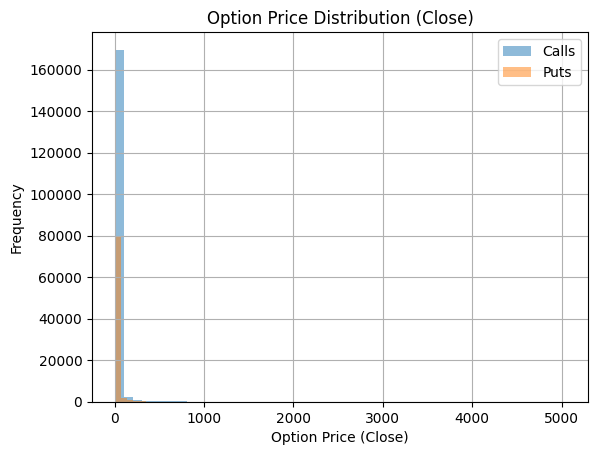

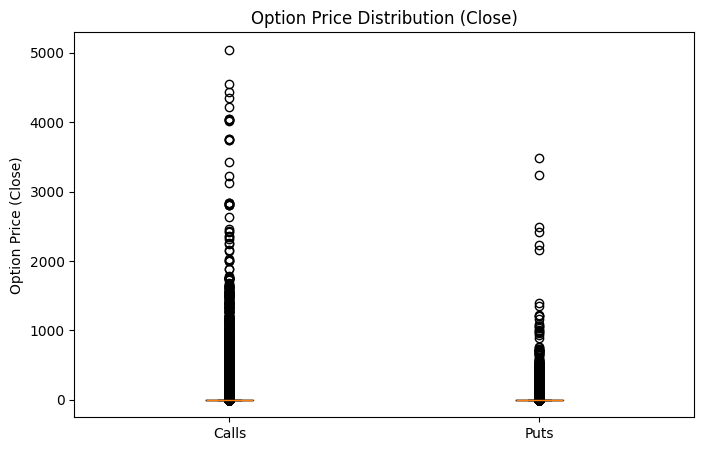

In [15]:
df_call['close'].hist(bins=50, alpha=0.5, label='Calls')
df_put['close'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Option Price Distribution (Close)')
plt.xlabel('Option Price (Close)')
plt.ylabel('Frequency')
plt.show()

data = [df_call['close'], df_put['close']]

plt.figure(figsize=(8, 5))
plt.boxplot(data, tick_labels=['Calls', 'Puts'])

plt.title('Option Price Distribution (Close)')
plt.ylabel('Option Price (Close)')

plt.show()


### `Trade Volume Distribution` <br>
The amount of trading activity for different options, showing how many contracts are being traded. <br>

### Observations
* Calls have a stronger positive skew, indicating most call options traded in relatively small volumes, indicating speculative behaviour on upwards movements.

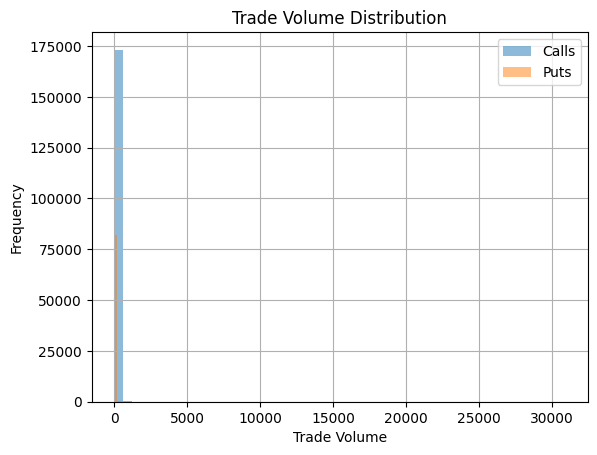

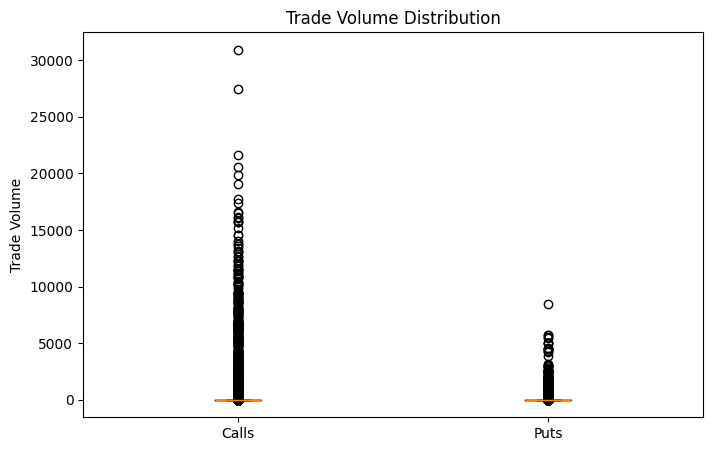

In [16]:
df_call['trade_volume'].hist(bins=50, alpha=0.5, label='Calls')
df_put['trade_volume'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Trade Volume Distribution')
plt.xlabel('Trade Volume')
plt.ylabel('Frequency')
plt.show()

data = [df_call['trade_volume'],df_put['trade_volume']]

plt.figure(figsize=(8,5))
plt.boxplot(data,tick_labels=['Calls','Puts'])

plt.title('Trade Volume Distribution')
plt.ylabel('Trade Volume')

plt.show()


### `Open Interest Distribution` <br>
The amount of trading activity for different options, showing how many contracts are being traded. <br>

### Observations
* Puts have a stronger positive skew, indicating market sentiment leaning towards upward movements

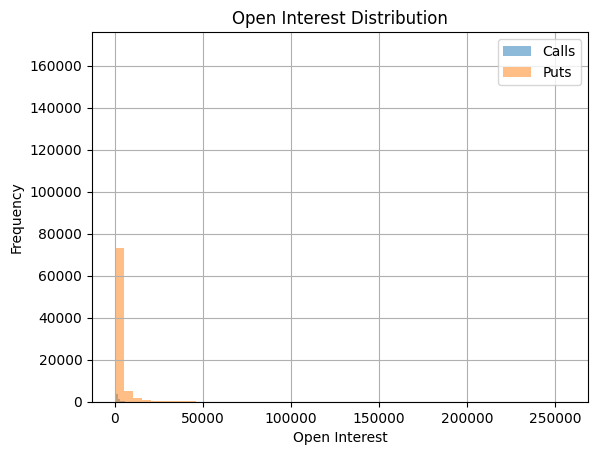

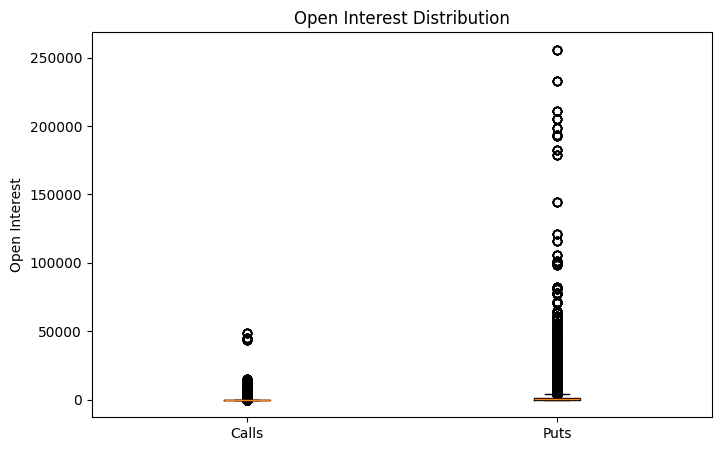

In [17]:
df_call['open_interest'].hist(bins=50, alpha=0.5, label='Calls')
df_put['open_interest'].hist(bins=50, alpha=0.5, label='Puts')
plt.legend()
plt.title('Open Interest Distribution')
plt.xlabel('Open Interest')
plt.ylabel('Frequency')
plt.show()

data = [df_call['open_interest'],df_put['open_interest']]

plt.figure(figsize=(8,5))
plt.boxplot(data,tick_labels=['Calls','Puts'])

plt.title('Open Interest Distribution')
plt.ylabel('Open Interest')

plt.show()



# 2. Correlation Analyses

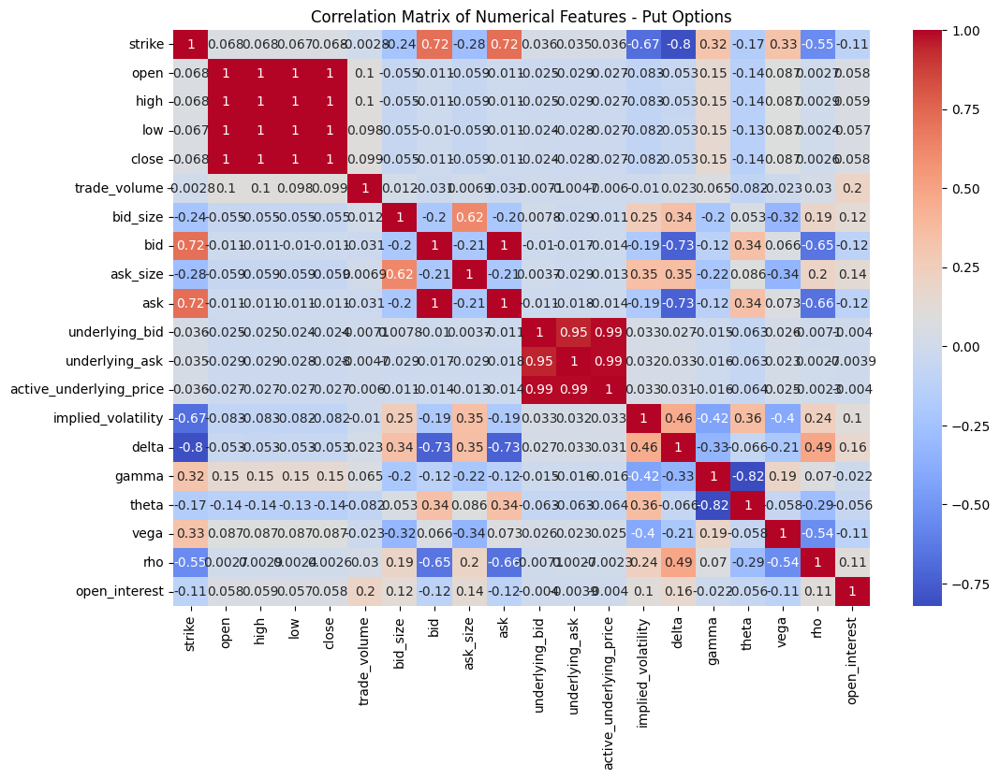

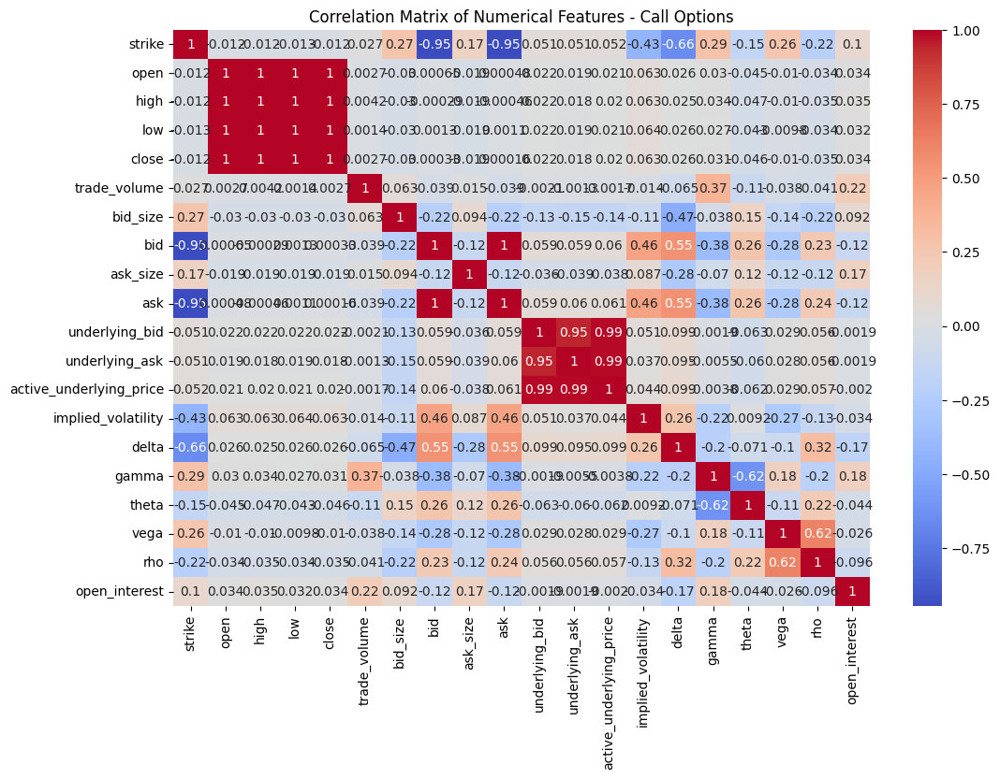

In [18]:
# Ensure the numeric columns are selected
numeric_df_call = df_call.select_dtypes(include=['float64', 'int64'])
numeric_df_put = df_put.select_dtypes(include=['float64', 'int64'])

# Correlation Matrix for Put Options
corr_matrix_put = numeric_df_put.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_put, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features - Put Options')
plt.show()

# Correlation Matrix for Call Options
corr_matrix_call = numeric_df_call.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_call, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Numerical Features - Call Options')
plt.show()


### Pairplots for Puts
For clarity and reducing clutter in pairplots, certain variables will not be shown in the pairplot analyses

Dropped variables:
* `open`, `high`, `low`. These variables represent prices of the asset recorded at different points of the day as the other variables often show similar patterns

In [19]:
numeric_df_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   strike                   82943 non-null  float64
 1   open                     82943 non-null  float64
 2   high                     82943 non-null  float64
 3   low                      82943 non-null  float64
 4   close                    82943 non-null  float64
 5   trade_volume             82943 non-null  int64  
 6   bid_size                 82943 non-null  int64  
 7   bid                      82943 non-null  float64
 8   ask_size                 82943 non-null  int64  
 9   ask                      82943 non-null  float64
 10  underlying_bid           82943 non-null  float64
 11  underlying_ask           82943 non-null  float64
 12  active_underlying_price  82943 non-null  float64
 13  implied_volatility       82943 non-null  float64
 14  delta                 

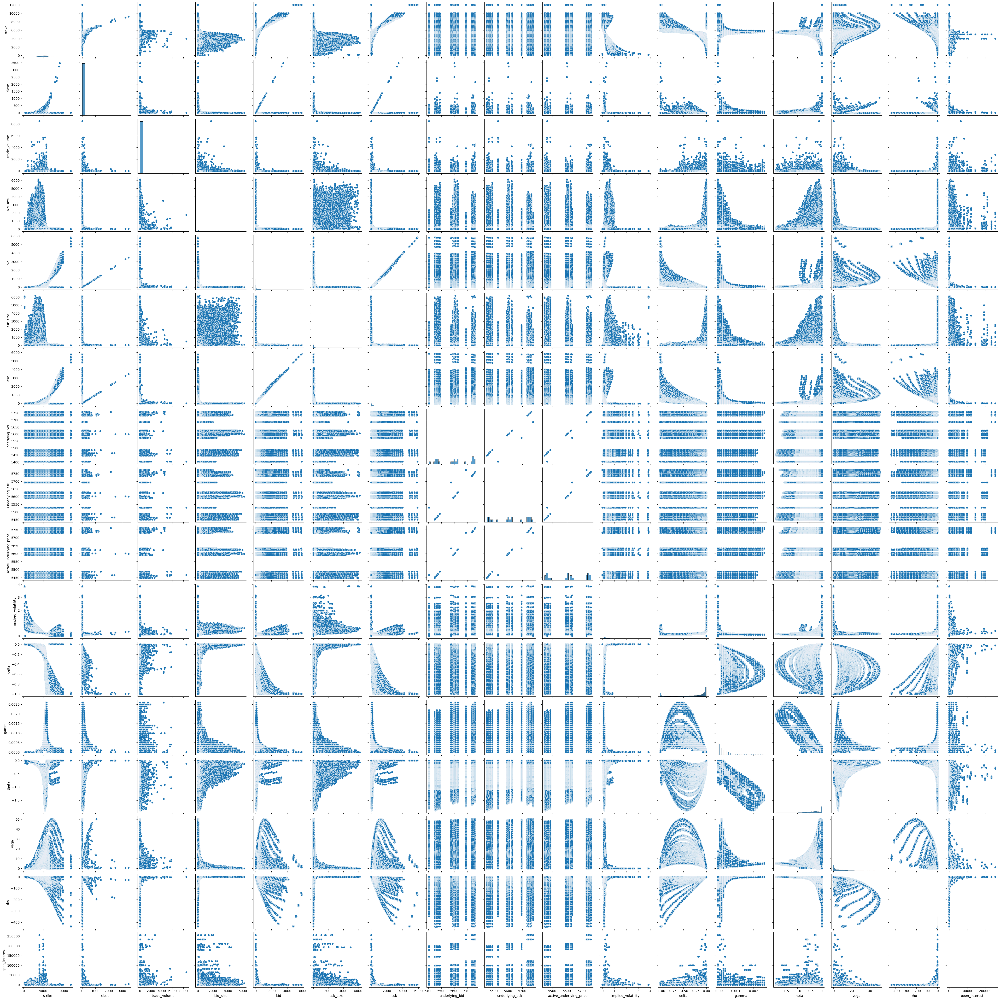

In [20]:
# Selecting a reduced set of variables for pairplot
reduced_numeric_df_put = numeric_df_put[['strike', 'close', 'trade_volume', 'bid_size','bid','ask_size','ask','underlying_bid','underlying_ask','active_underlying_price','implied_volatility', 
                                 'delta', 'gamma', 'theta', 'vega', 'rho', 'open_interest']]

sns.pairplot(reduced_numeric_df_put)
plt.show()

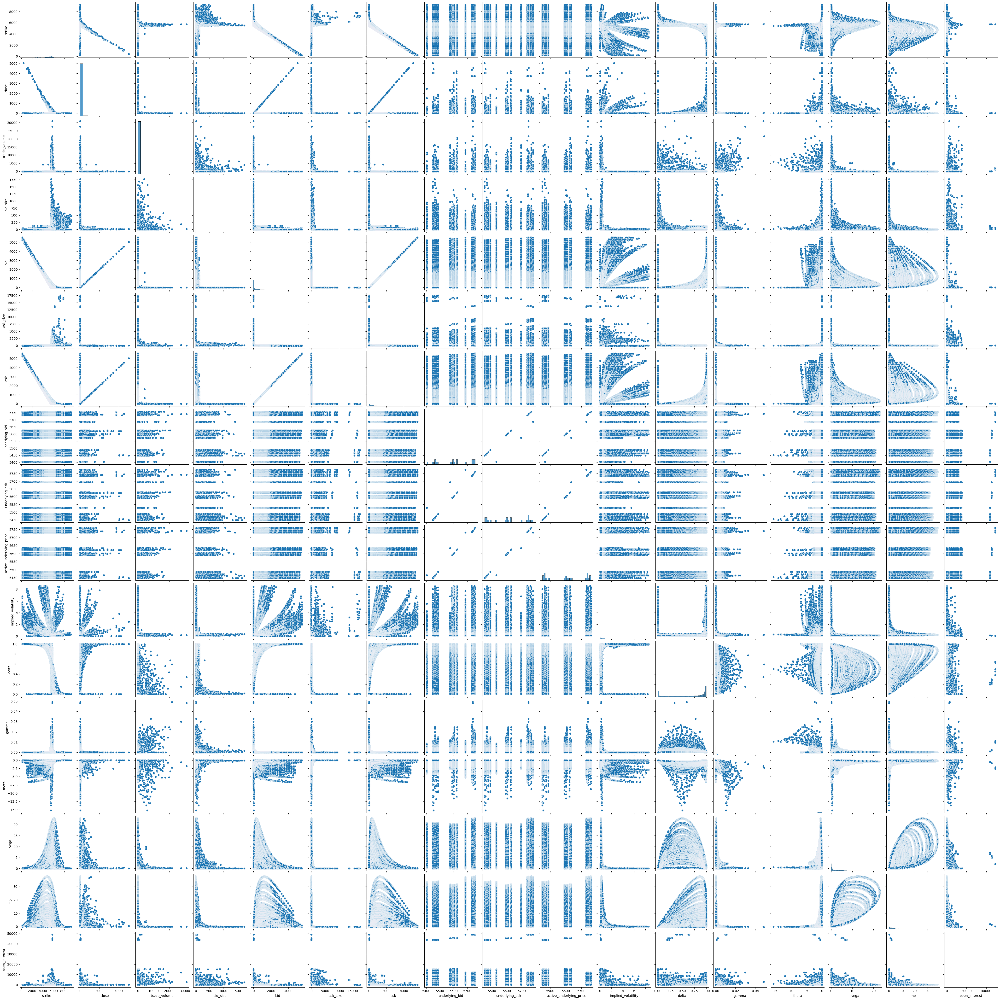

In [21]:
# Selecting a reduced set of variables for pairplot
reduced_numeric_df_call = numeric_df_call[['strike', 'close', 'trade_volume', 'bid_size','bid','ask_size','ask','underlying_bid','underlying_ask','active_underlying_price','implied_volatility', 
                                 'delta', 'gamma', 'theta', 'vega', 'rho', 'open_interest']]

sns.pairplot(reduced_numeric_df_call)
plt.show()

# 3. Time Series Data

In [22]:
# df_put.set_index('quote_datetime', inplace=True)
df_put.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82943 entries, 0 to 82942
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   quote_datetime           82943 non-null  datetime64[ns]
 1   expiration               82943 non-null  datetime64[ns]
 2   strike                   82943 non-null  float64       
 3   option_type              82943 non-null  object        
 4   open                     82943 non-null  float64       
 5   high                     82943 non-null  float64       
 6   low                      82943 non-null  float64       
 7   close                    82943 non-null  float64       
 8   trade_volume             82943 non-null  int64         
 9   bid_size                 82943 non-null  int64         
 10  bid                      82943 non-null  float64       
 11  ask_size                 82943 non-null  int64         
 12  ask                      82943 n

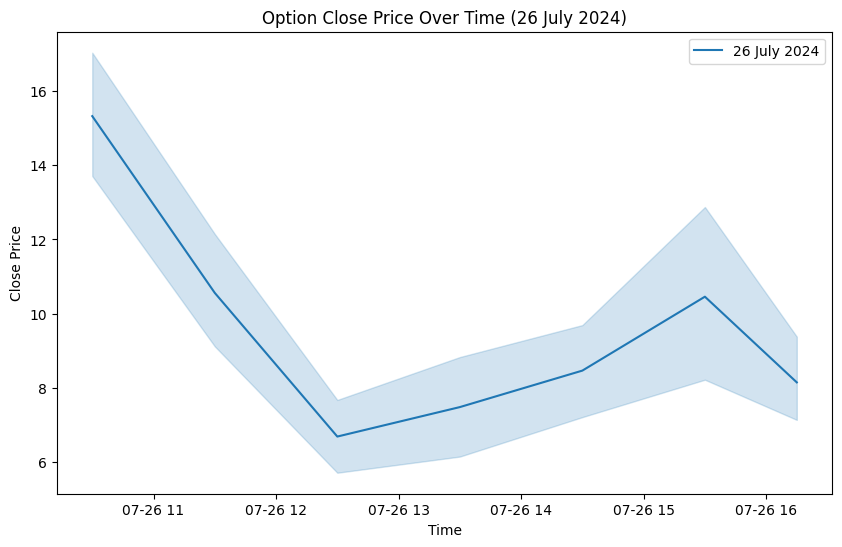

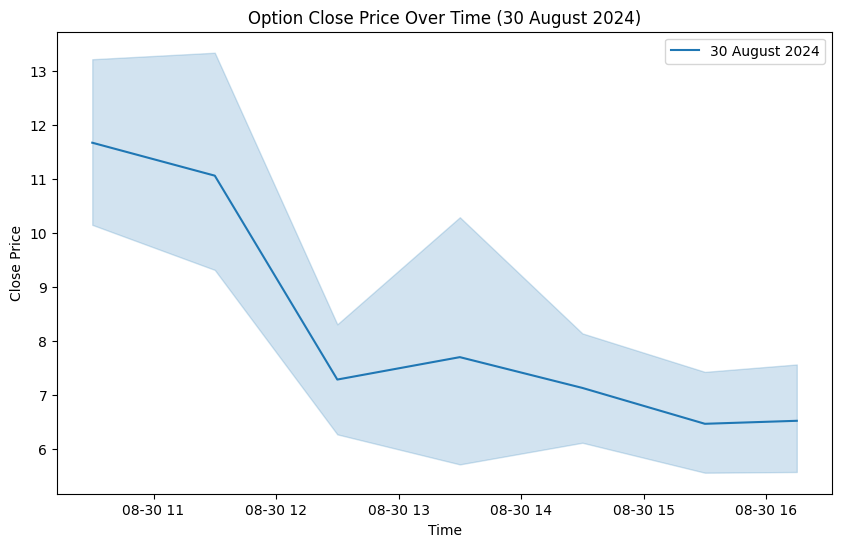

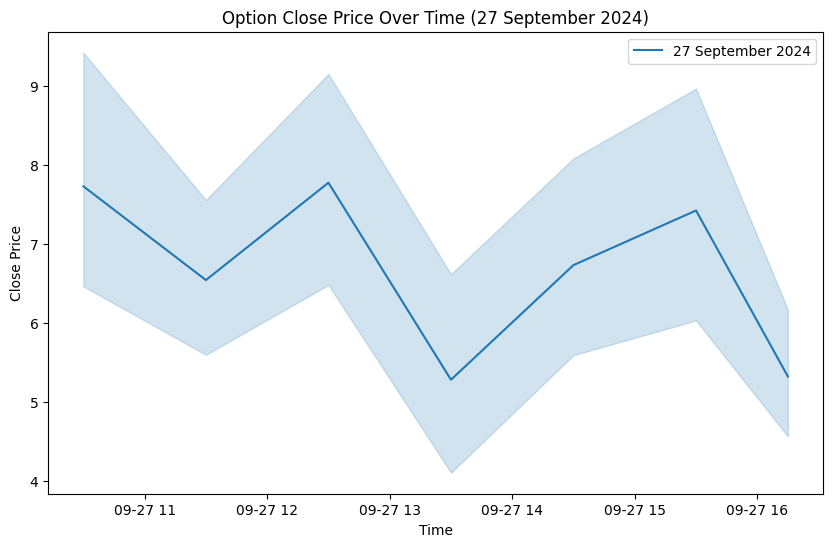

In [23]:
# Filter the data for each specific date
df_put_july = df_put[df_put['quote_datetime'].dt.date == pd.to_datetime('2024-07-26').date()]
df_put_august = df_put[df_put['quote_datetime'].dt.date == pd.to_datetime('2024-08-30').date()]
df_put_september = df_put[df_put['quote_datetime'].dt.date == pd.to_datetime('2024-09-27').date()]

plt.figure(figsize=(10, 6))
sns.lineplot(x=df_put_july['quote_datetime'], y=df_put_july['close'], label='26 July 2024')
plt.title('Option Close Price Over Time (26 July 2024)')
plt.xlabel('Time')
plt.ylabel('Close Price')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(x=df_put_august['quote_datetime'], y=df_put_august['close'], label='30 August 2024')
plt.title('Option Close Price Over Time (30 August 2024)')
plt.xlabel('Time')
plt.ylabel('Close Price')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(x=df_put_september['quote_datetime'], y=df_put_september['close'], label='27 September 2024')
plt.title('Option Close Price Over Time (27 September 2024)')
plt.xlabel('Time')
plt.ylabel('Close Price')
plt.legend()
plt.show()


# 4. Greeks

In [24]:
greeks = ['delta', 'gamma', 'theta', 'vega', 'rho']

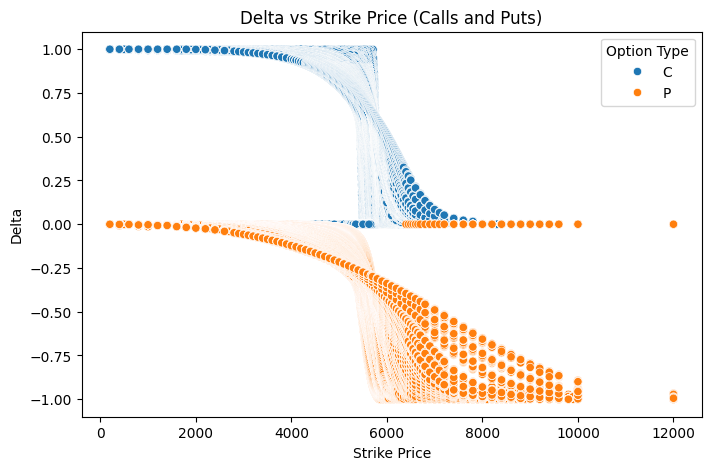

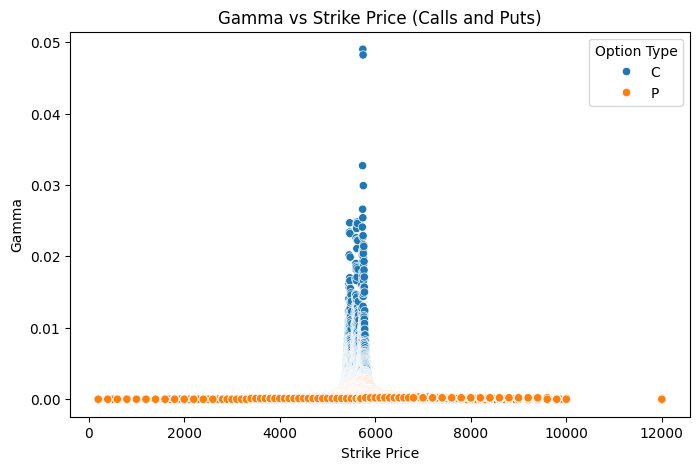

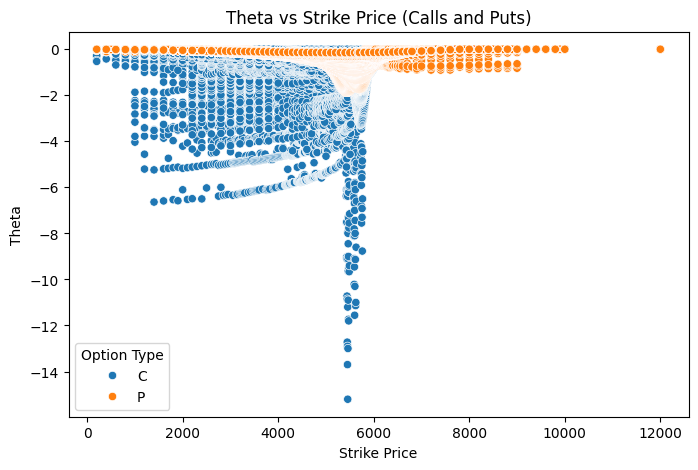

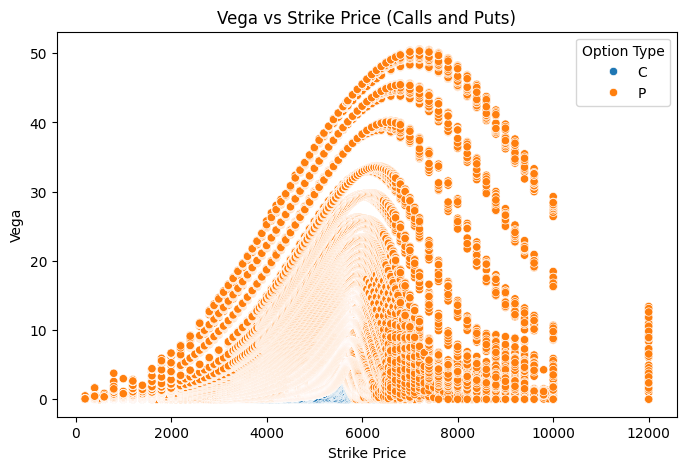

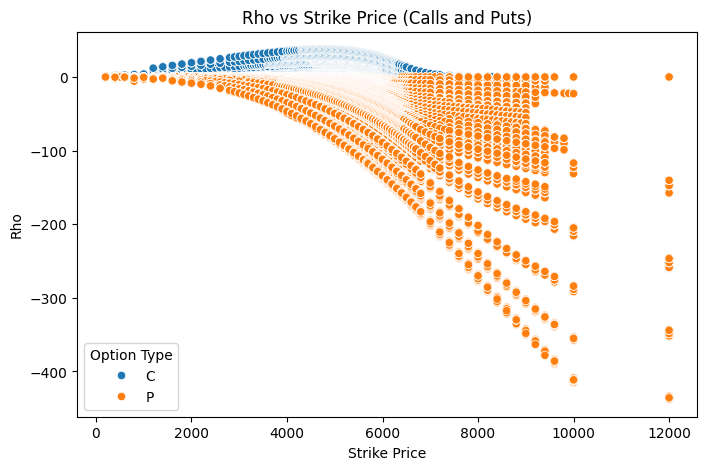

In [25]:
# Combine df_call and df_put into one dataframe
df_combined = pd.concat([df_call, df_put])

# Scatter plots of Greeks vs Strike and Implied Volatility for both calls and puts
for greek in greeks:
    plt.figure(figsize=(8, 5))
    
    # Plot combined data with hue for option_type
    sns.scatterplot(x='strike', y=greek, hue='option_type', data=df_combined)
    
    plt.title(f'{greek.capitalize()} vs Strike Price (Calls and Puts)')
    plt.xlabel('Strike Price')
    plt.ylabel(greek.capitalize())
    plt.legend(title='Option Type')
    plt.show()